**<center> <span style="color:#0F52BA;font-family:serif; font-size:32px;"> Diabetes Datase Analysis And Prediction 📈</span> </center>**

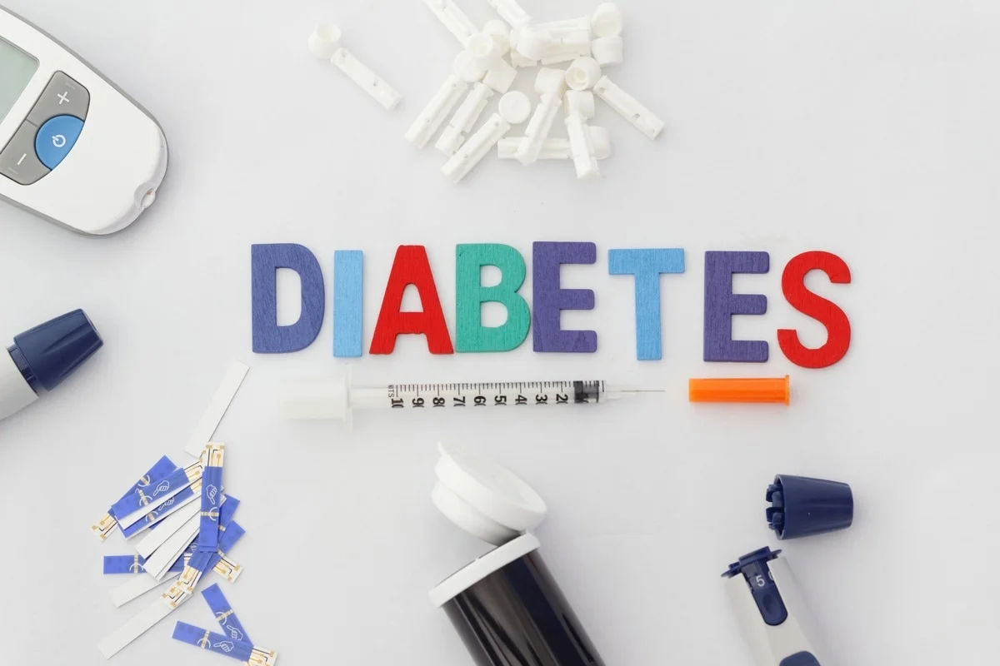

# <span style="font-family:serif; font-size:28px;"> Content</span>

1. [Introduction](#1)
    * [Columns Understanding](#2)
    
    
2. [Loading libraries and data](#3)  





3. [Main Functions for Analysis And Feature Eng](#5)


4. [General Analysis](#6)




5. [Specific Analysis ](#7)


6. [Remove Outlier](#8)



<a id = "1" ></a>
# <span style="color:#0F52BA;font-family:serif;">1. Introduction </span>

<a id = "introduction" ></a>

This dataset is originally from the N. Inst. of Diabetes & Diges. & Kidney Dis.

About Dataset Context This dataset is originally from the National Institute of Diabetes and Digestive and Kidney Diseases. The objective is to predict based on diagnostic measurements whether a patient has diabetes.

Content Several constraints were placed on the selection of these instances from a larger database. In particular, all patients here are females at least 21 years old of Pima Indian heritage.



<a id = "2" ></a>
# <span style="color:#0F52BA;font-family:serif;">  Columns Understanding </span>

Pregnancies: Number of times pregnant 

Glucose: Plasma glucose concentration a 2 hours in an oral glucose tolerance test 

BloodPressure: Diastolic blood pressure (mm Hg) 

SkinThickness: Triceps skin fold thickness (mm) 

Insulin: 2-Hour serum insulin (mu U/ml) 

BMI: Body mass index (weight in kg/(height in m)^2) 

DiabetesPedigreeFunction: Diabetes pedigree function 

Age: Age (years) 

Outcome: Class variable (0 or 1) Sources: (a) 


<a id = "3" ></a>
# <span style="font-family:serif; font-size:28px;"> 2. Loading libraries and data</span>
 <a id="loading"></a>

In [19]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.patheffects as path_effects

In [20]:
df_org = pd.read_csv('diabetes.csv')
df_org

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [21]:
df_org.shape

(768, 9)

In [22]:
df_org.describe()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
count,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000,768.000000
mean,3.845052,120.894531,69.105469,20.536458,79.799479,31.992578,0.471876,33.240885,0.348958
std,3.369578,31.972618,19.355807,15.952218,115.244002,7.884160,0.331329,11.760232,0.476951
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,21.000000,0.000000
25%,1.000000,99.000000,62.000000,0.000000,0.000000,27.300000,0.243750,24.000000,0.000000
50%,3.000000,117.000000,72.000000,23.000000,30.500000,32.000000,0.372500,29.000000,0.000000
75%,6.000000,140.250000,80.000000,32.000000,127.250000,36.600000,0.626250,41.000000,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,81.000000,1.000000


In [23]:
def nans1(df):
    nan_count = df.isna().sum().sort_values(ascending= False)
    nan_perc= (nan_count / df.shape[0]) * 100
    nans = pd.concat([nan_count,nan_perc],axis = 1).reset_index()
    nans.rename(columns = {0 : 'NaN Count' , 1:'Nan Perc'},inplace= True)
    return nans

In [24]:
nans1(df_org)

,index,NaN Count,Nan Perc
0,Pregnancies,0,0.0
1,Glucose,0,0.0
2,BloodPressure,0,0.0
3,SkinThickness,0,0.0
4,Insulin,0,0.0
5,BMI,0,0.0
6,DiabetesPedigreeFunction,0,0.0
7,Age,0,0.0
8,Outcome,0,0.0


In [25]:
df = df_org.copy()
df[(df.loc[:,[ 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI']] == 0).any(axis=1)]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
5,5,116,74,0,0,25.6,0.201,30,0
7,10,115,0,0,0,35.3,0.134,29,0
...,...,...,...,...,...,...,...,...,...
761,9,170,74,31,0,44.0,0.403,43,1
762,9,89,62,0,0,22.5,0.142,33,0
764,2,122,70,27,0,36.8,0.340,27,0
766,1,126,60,0,0,30.1,0.349,47,1


In [26]:
df[df.loc[:,[ 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI']] == 0] = np.nan
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,NaN,33.6,0.627,50,1
1,1,85.0,66.0,29.0,NaN,26.6,0.351,31,0
2,8,183.0,64.0,NaN,NaN,23.3,0.672,32,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.0,180.0,32.9,0.171,63,0
764,2,122.0,70.0,27.0,NaN,36.8,0.340,27,0
765,5,121.0,72.0,23.0,112.0,26.2,0.245,30,0
766,1,126.0,60.0,NaN,NaN,30.1,0.349,47,1


In [27]:
nans1(df)

,index,NaN Count,Nan Perc
0,Insulin,374,48.697917
1,SkinThickness,227,29.557292
2,BloodPressure,35,4.557292
3,BMI,11,1.432292
4,Glucose,5,0.651042
5,Pregnancies,0,0.000000
6,DiabetesPedigreeFunction,0,0.000000
7,Age,0,0.000000
8,Outcome,0,0.000000


In [28]:
def median_target(var):   
    
    temp = df[df[var].notnull()]
    temp = df[[var, 'Outcome']].groupby(['Outcome'])[[var]].median().reset_index()
    return temp

columns = df.columns
columns = columns.drop("Outcome")

for col in columns:
    df.loc[(df['Outcome'] == 0 ) & (df[col].isnull()), col] = median_target(col)[col][0]
    df.loc[(df['Outcome'] == 1 ) & (df[col].isnull()), col] = median_target(col)[col][1]

In [29]:
df

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,169.5,33.6,0.627,50,1
1,1,85.0,66.0,29.0,102.5,26.6,0.351,31,0
2,8,183.0,64.0,32.0,169.5,23.3,0.672,32,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
4,0,137.0,40.0,35.0,168.0,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.0,180.0,32.9,0.171,63,0
764,2,122.0,70.0,27.0,102.5,36.8,0.340,27,0
765,5,121.0,72.0,23.0,112.0,26.2,0.245,30,0
766,1,126.0,60.0,32.0,169.5,30.1,0.349,47,1


<a id = "5" ></a>
# <span style="font-family:serif; font-size:28px;"> 3. Main Function And Feature Eng  </span>
<a id = "missingvalue" ></a>

# Full  Function in kaggle Notebook (Hide Because of the large code size)

In [30]:
def label_txt_resta(txt,w = 0.4,h = 0.5,font_size = 40,facecolor = '#6d6875' ,color ='#d5bdaf' ,hi = 25):
    fig = plt.figure(figsize=(22, hi))
    plt.axis('off')


    t = plt.text(w, h,
                txt,
                fontsize = font_size, 
                weight = 1000, 
                va ='center'
                ,color = color)
    fig.set_facecolor(facecolor)
    plt.tight_layout()
    plt.show()
    
    
def group_agg(col,index,how):
    return new_df.groupby("Outcome_interval")[[col]].aggregate(how).values[index][index]



def determine_strength(r):
    
    if r == -1:
        return 'Perfect negative'
    elif r > -1 and r < -0.5:
        return 'Strong Negative'
    elif r == -0.5:
        return 'Medium Negative'
    elif r > -0.5 and r < 0 :
        return 'Weak Negative'
    elif r == 0:
        return 'No Correaltion'
    elif r > 0 and r < 0.5:
        return 'Weak Positive'
    elif r == 0.5:
        return 'Medium Positive'
    elif r > 0.5 and r < 1:
        return 'Strong Positive'
    elif r == 1:
        return 'Perfect Positive'

def label_txt(txt,w = 0.4,h = 0.5,font_size = 40,facecolor = '#bde0fe'):
    fig = plt.figure(figsize=(22, 0.8))
    plt.axis('off')


    t = plt.text(w, h,
                txt,
                fontsize = font_size, 
                weight = 1000, 
                va ='center')
    fig.set_facecolor(facecolor)
    # hatch ='xxxx'
    t.set_path_effects([path_effects.PathPatchEffect(offset =(3, -4),
                                                   
                                                    facecolor ='gray'),
                        path_effects.PathPatchEffect(edgecolor ='white', 
                                                    linewidth = 1.1,
                                                    facecolor ='black')])
    


def interval_df(int_age = 5):

    df_interval = df.copy()
    df_interval


    max = 81
    min = 21
    interval_jump = int_age

    list_interval_Age = []

    for i in range(min,max+1,interval_jump):
        if i == (max - (interval_jump)):
            list_interval_Age.append(f"{i}-{max}")
            break

        if i == min:
            list_interval_Age.append(f"{i}-{i + interval_jump -1}")
            continue
            
        list_interval_Age.append(f"{i}-{i+interval_jump-1}")

   

    if interval_jump == 5:
        cutoff_Age = [20,25,30,35,40,45,50,55,60,65,70,75,81]

    if interval_jump == 10:
        cutoff_Age = [20,30,40,50,60,70,81]

    df_interval['Age_interval'] = pd.cut(df['Age'],bins = cutoff_Age,labels = list_interval_Age)




    cutoff_Blood = [0,59,79,89,119,df_interval['BloodPressure'].max() + 10]

    list_interval_Blood = ['Low Blood Preasure (dangerous)','Normal or Elevated','High Blood Preasure Stage 1',"High Blood Preasure Stage 2","Hypertensive Crisis"]
    df_interval['BloodPressure_interval'] = pd.cut(df['BloodPressure'],bins = cutoff_Blood,labels = list_interval_Blood)




    cutoff_Glucose= [0,139,199]

    list_interval_Glucose = ['Normal Diabetes ( > 140 )','Pre Diabetes ( 140-199 )']
    df_interval['Glucose_interval'] = pd.cut(df['Glucose'],bins = cutoff_Glucose,labels = list_interval_Glucose)
    


    cutoff_BMI= [0,18.4,24.5,29.9,34.9,df_interval['BMI'].max() + 10]

    list_interval_BMI = ['UNDERWEIGHT','NORMAL',"OVERWEIGHT","OBESE","EXTREMELY OBESE"]
    df_interval['BMI_interval'] = pd.cut(df['BMI'],bins = cutoff_BMI,labels = list_interval_BMI)





    return df_interval



def General_Analysis():
    label_txt(f'Welcome to Diabetes Dataset Analysis',w = 0.15)

    label_txt(f'               General Analysis',w = 0.15,facecolor = '#66b5ff')

    fig, axes = plt.subplot_mosaic("Ac;DD",figsize = (20,15))

    sns.set_context('notebook',font_scale= 1.1)
    plt.rcParams['figure.facecolor'] = 'ghostwhite'
    plt.rcParams['axes.facecolor'] = 'white'


    g = sns.countplot(x = df['Outcome'].map({0:"Not DIABETES",1:"DIABETES"}),order = df['Outcome'].map({0:"Not DIABETES",1:"DIABETES"}).value_counts().index, palette="crest", ax = axes['A'])
    axes['A'].set_title('Number of DIABETES AND NOT DIABETES IN DATASET')
    g.bar_label(g.containers[0])


    axes['c'].pie(df['Outcome'].value_counts().values , labels =[" Not DIABETES","DIABETES"]
            , shadow = True , autopct= '%1.1f%%', wedgeprops= {'edgecolor' : 'black'} )
    axes['c'].legend([" Not DIABETES","DIABETES"])
    axes['c'].set_title("Percentage of DIABETES AND NOT DIABETES IN DATASET")
    axes['A'].patch.set_edgecolor('black')  

    axes['A'].patch.set_linewidth(3)  

    axes['c'].patch.set_edgecolor('black')  

    axes['c'].patch.set_linewidth(3)  

    axes['D'].patch.set_edgecolor('black')  

    axes['D'].patch.set_linewidth(3)  

    sns.heatmap(df.corr(),fmt = '.2f' ,annot=True, cmap = "crest",ax = axes['D'])
    plt.title('The Correlation between Nutrition')
    plt.tight_layout()
    plt.show()

    label_txt(f'             Pair plot for Outcome',w = 0.15,facecolor = '#66b5ff')


    g  = sns.pairplot(data = new_df, hue="Outcome_interval")
    g.fig.suptitle("Pair plot for Outcome", y=1.08)
    plt.tight_layout()
    plt.show()

    label_txt(f"Columns  vs Outcome ",w = 0.25)
    fig, axs = plt.subplots(4, 2, figsize = (30, 15),dpi = 200)#dpi = 120

    col = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
           'BMI', 'DiabetesPedigreeFunction', 'Age']
    co = 0

    for i in range(4): 
            for c in range(2):
                g = sns.boxplot(y = "Outcome_interval", x= col[co],data = new_df,ax = axs[i][c])
                #sns.swarmplot(y = "Outcome_interval", x= col[co],data = new_df,ax = axs[i][c],color=".25")
                axs[i][c].set_title(f"")
                co+=1
    plt.tight_layout()
    plt.show()
    

    label_txt(f"Count for Categorical Feature Values by Outcome ",w = 0.05)
    fig, axs = plt.subplots(2, 2, figsize = (30, 15),dpi = 200)#dpi = 120


    col_imp = ['Age_interval','BloodPressure_interval', 'Glucose_interval', 'BMI_interval']

    co = 0

    for i in range(2): 
            for c in range(2):
                g = sns.countplot(hue = "Outcome_interval", y= col_imp[co],data = new_df,ax = axs[i][c],palette="Set2")
                g.bar_label(g.containers[0])
                g.bar_label(g.containers[1])
                axs[i][c].set_title(f"")
                co+=1
    plt.tight_layout()
    plt.show()


    

    col_imp = ['Age_interval','BloodPressure_interval', 'Glucose', 
               'BMI_interval','Pregnancies','SkinThickness']

    label_txt(f"      Changes in Outcome over Some Features ",w = 0.05)



    fig, axs = plt.subplots(3, 2, figsize = (35, 20),dpi = 200)#dpi = 120

    co = 0


    for i in range(3): 
            for c in range(2):
                g = sns.lineplot(x = col_imp[co],data = new_df, y= "Outcome",ax = axs[i][c])

                axs[i][c].set_title(f"")
                co+=1


    plt.tight_layout()
    plt.show()    

    
    
    
    label_txt(f"                     Statistical Info #1 ",w = 0.05)

    label_txt_resta(f"""-----------------------------------------Max & Min For Features By Outcome-------------------------------------

    Max BloodPressure for DIABETES ----> {group_agg("BloodPressure",0,np.max)} , Max BloodPressure for Not DIABETES ----> {group_agg("BloodPressure",-1,np.max)}

    Min BloodPressure for DIABETES ----> {group_agg("BloodPressure",0,np.min)} , Min BloodPressure for Not DIABETES ----> {group_agg("BloodPressure",-1,np.min)}




    Max Glucose for DIABETES ----> {group_agg("Glucose",0,np.max)} , Max Glucose for Not DIABETES ----> {group_agg("Glucose",-1,np.max)}

    Min Glucose for DIABETES ----> {group_agg("Glucose",0,np.min)} , Min Glucose for Not DIABETES ----> {group_agg("Glucose",-1,np.min)}




    Max Pregnancies for DIABETES ----> {group_agg("Pregnancies",0,np.max)} , Max Pregnancies for Not DIABETES ----> {group_agg("Pregnancies",-1,np.max)}

    Min Pregnancies for DIABETES ----> {group_agg("Pregnancies",0,np.min)} , Min Pregnancies for Not DIABETES ----> {group_agg("Pregnancies",-1,np.min)}




    Max SkinThickness for DIABETES ----> {group_agg("SkinThickness",0,np.max)} , Max SkinThickness for Not DIABETES ----> {group_agg("SkinThickness",-1,np.max)}

    Min SkinThickness for DIABETES ----> {group_agg("SkinThickness",0,np.min)} , Min SkinThickness for Not DIABETES ----> {group_agg("SkinThickness",-1,np.min)}




    Max Insulin for DIABETES ----> {group_agg("Insulin",0,np.max)} , Max Insulin for Not DIABETES ----> {group_agg("Insulin",-1,np.max)}

    Min Insulin for DIABETES ----> {group_agg("Insulin",0,np.min)} , Min Insulin for Not DIABETES ----> {group_agg("Insulin",-1,np.min)}




    Max BMI for DIABETES ----> {group_agg("BMI",0,np.max)} , Max BMI for Not DIABETES ----> {group_agg("BMI",-1,np.max)}

    Min BMI for DIABETES ----> {group_agg("BMI",0,np.min)} , Min BMI for Not DIABETES ----> {group_agg("BMI",-1,np.min)}




    Max Age for DIABETES ----> {group_agg("Age",0,np.max)} , Max Age for Not DIABETES ----> {group_agg("Age",-1,np.max)}

    Min Age for DIABETES ----> {group_agg("Age",0,np.min)} , Min Age for Not DIABETES ----> {group_agg("Age",-1,np.min)}


    """
                          
                    
                    
                    ,h = 1,w =0,facecolor='ghostwhite',color='Black')
    
    
    label_txt(f"                     Statistical Info #2 ",w = 0.05)


    label_txt_resta(f"""----------------------------------------------Mean & Median For Features By Outcome-------------------------------------

    Mean BloodPressure for DIABETES ----> {group_agg("BloodPressure",0,np.mean):.2f} , Mean BloodPressure for Not DIABETES ----> {group_agg("BloodPressure",-1,np.mean):.2f}

    Median BloodPressure for DIABETES ----> {group_agg("BloodPressure",0,np.median):.2f} , Median BloodPressure for Not DIABETES ----> {group_agg("BloodPressure",-1,np.median):.2f}




    Mean Glucose for DIABETES ----> {group_agg("Glucose",0,np.mean):.2f} , Mean Glucose for Not DIABETES ----> {group_agg("Glucose",-1,np.mean):.2f}

    Median Glucose for DIABETES ----> {group_agg("Glucose",0,np.median):.2f} , Median Glucose for Not DIABETES ----> {group_agg("Glucose",-1,np.median):.2f}




    Mean Pregnancies for DIABETES ----> {group_agg("Pregnancies",0,np.mean):.2f} , Mean Pregnancies for Not DIABETES ----> {group_agg("Pregnancies",-1,np.mean):.2f}

    Median Pregnancies for DIABETES ----> {group_agg("Pregnancies",0,np.median):.2f} , Median Pregnancies for Not DIABETES ----> {group_agg("Pregnancies",-1,np.median):.2f}




    Mean SkinThickness for DIABETES ----> {group_agg("SkinThickness",0,np.mean):.2f} , Mean SkinThickness for Not DIABETES ----> {group_agg("SkinThickness",-1,np.mean):.2f}

    Median SkinThickness for DIABETES ----> {group_agg("SkinThickness",0,np.median):.2f} , Median SkinThickness for Not DIABETES ----> {group_agg("SkinThickness",-1,np.median):.2f}




    Mean Insulin for DIABETES ----> {group_agg("Insulin",0,np.mean):.2f} , Mean Insulin for Not DIABETES ----> {group_agg("Insulin",-1,np.mean):.2f}

    Median Insulin for DIABETES ----> {group_agg("Insulin",0,np.median):.2f} , Median Insulin for Not DIABETES ----> {group_agg("Insulin",-1,np.median):.2f}




    Mean BMI for DIABETES ----> {group_agg("BMI",0,np.mean):.2f} , Mean BMI for Not DIABETES ----> {group_agg("BMI",-1,np.mean):.2f}

    Median BMI for DIABETES ----> {group_agg("BMI",0,np.median):.2f} , Median BMI for Not DIABETES ----> {group_agg("BMI",-1,np.median):.2f}




    Mean Age for DIABETES ----> {group_agg("Age",0,np.mean):.2f} , Mean Age for Not DIABETES ----> {group_agg("Age",-1,np.mean):.2f}

    Median Age for DIABETES ----> {group_agg("Age",0,np.median):.2f} , Median Age for Not DIABETES ----> {group_agg("Age",-1,np.median):.2f}


    """
                          
                    
                    
                    ,h = 1,w =0,facecolor='ghostwhite',color='Black')
    
    plt.tight_layout()
    plt.show()

def Specific_Analysis(col_specific):
    sns.set_context('notebook',font_scale= 1.2)
    plt.rcParams['figure.facecolor'] = 'ghostwhite'
    plt.rcParams['axes.facecolor'] = 'white'


    col = col_specific
    col_cat = f"{col}_interval"
    label_txt(f'    Analysis for {col} in Dataset',w = 0.15)

    fig, axs = plt.subplot_mosaic("AB;DD",figsize = (30,20))

    g = sns.countplot(x = new_df[col_cat],order = new_df[col_cat].value_counts().index, palette="crest", ax = axs["A"])
    axs["A"].set_title(f'Count  of  Each {f"{col}_interval"} Category in Dataset ')
    g.bar_label(g.containers[0])



    axs["B"].pie(new_df[col_cat].value_counts().values,labels=list(new_df[col_cat].value_counts().index) 
            , shadow = True , autopct= '%1.1f%%', wedgeprops= {'edgecolor' : 'black'} )
    axs["B"].legend(list(new_df[col_cat].value_counts().index))



    axs["B"].set_title(f"Percentage {col_cat} in Dataset ")


    g = sns.countplot(x = col_cat,data =new_df,hue="Outcome_interval", palette="flare",ax =axs['D'])
    g.bar_label(g.containers[0])
    g.bar_label(g.containers[1])
    axs['D'].set_title(f'Number of DIABETES AND NOT DIABETES in Each {col_cat}')

    plt.tight_layout()
    plt.show()




    label_txt(f"      Density Plot of {col} Having Diabete Or No",facecolor='#fefae0',w = 0.05)
    plt.subplots(figsize = (20, 10))
    sns.kdeplot(x = col ,data =new_df ,hue ="Outcome_interval",fill = True)
    plt.title(f'Density Plot of {col} Having Diabete Or No')
    plt.show()


    plt.subplots(figsize = (20, 10))

    sns.histplot(x = col ,data =new_df  ,hue ="Outcome_interval" ,kde = True)



    plt.show()

    col_names = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
           'BMI', 'DiabetesPedigreeFunction', 'Age']

    label_txt(f"      Count For {col} By Multiple Feature ",facecolor='#fefae0',w = 0.05)
    for i in range(len(col_names)):

        if col_names[i] == col:
            continue

        plt.subplots(figsize = (28, 10))

        g = sns.barplot(x = col_cat,y = col_names[i],data = new_df,hue = 'Outcome_interval',estimator=np.mean,ci = None)
        g.bar_label(g.containers[0])

        g.bar_label(g.containers[1])

        plt.tight_layout()
        plt.show()

        
        
    num_feature = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI',"Age"]

    label_txt(f"    Changes in Some Feature over  {col} ",w = 0.05)







    num_feature = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI',"Age"]




    fig, axs = plt.subplots(3, 2, figsize = (25, 20),dpi = 200)#dpi = 120

    co = 0


    for i in range(3): 
        for c in range(2):

            if (num_feature[co] == col):
                co+=1

            g = sns.lineplot(x = col,data = new_df, y= num_feature[co],ax = axs[i][c])

            axs[i][c].set_title(f"")
            co+=1


    plt.tight_layout()
    plt.show()

    

    num_feature = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin','BMI',"Age"]



    label_txt(f"      The Relation between {col} and other Features",facecolor='#fefae0',w = 0.05)
    fig, axs = plt.subplots(3, 2, figsize = (25, 20),dpi = 200)#dpi = 120

    co = 0


    
    
    
    for i in range(3): 
        for c in range(2):

            if (num_feature[co] == col):
                co+=1


            axs[i][c].set_title(f"The Correlation Between {col} and {num_feature[co]} is :{new_df.corr()[col][num_feature[co]]:.2f}  --> {determine_strength(new_df.corr()[col][num_feature[co]])}")
            g = sns.scatterplot(x = col,data = new_df, y= num_feature[co],hue = 'Outcome_interval',ax = axs[i][c])


            co+=1


    plt.tight_layout()
    plt.show()    
    
    label_txt(f"      Count of Diabetes And Not Diabetes Pregnancis",facecolor='#fefae0',w = 0.05)

    plt.figure(figsize=(20,10))
    g = sns.countplot(x = 'Pregnancies',data =new_df,hue = 'Outcome_interval')
    g.bar_label(g.containers[0])

    g.bar_label(g.containers[1])
    plt.tight_layout()
    plt.show()

In [31]:
df_interval = df.copy()
new_df = interval_df(5)
new_df['Outcome_interval'] = df['Outcome'].map({0:"Not DIABETES",1:"DIABETES"})
print(new_df)

     Pregnancies  Glucose  BloodPressure  SkinThickness  Insulin   BMI  \
0              6    148.0           72.0           35.0    169.5  33.6   
1              1     85.0           66.0           29.0    102.5  26.6   
2              8    183.0           64.0           32.0    169.5  23.3   
3              1     89.0           66.0           23.0     94.0  28.1   
4              0    137.0           40.0           35.0    168.0  43.1   
..           ...      ...            ...            ...      ...   ...   
763           10    101.0           76.0           48.0    180.0  32.9   
764            2    122.0           70.0           27.0    102.5  36.8   
765            5    121.0           72.0           23.0    112.0  26.2   
766            1    126.0           60.0           32.0    169.5  30.1   
767            1     93.0           70.0           31.0    102.5  30.4   

     DiabetesPedigreeFunction  Age  Outcome Age_interval  \
0                       0.627   50        1        

<a id = "6" ></a>
# <span style="font-family:serif; font-size:28px;"> 4. General Analysis </span>
<a id = "6" ></a>

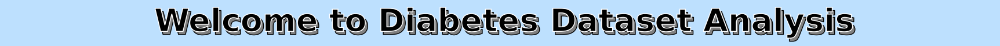

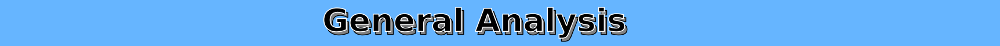

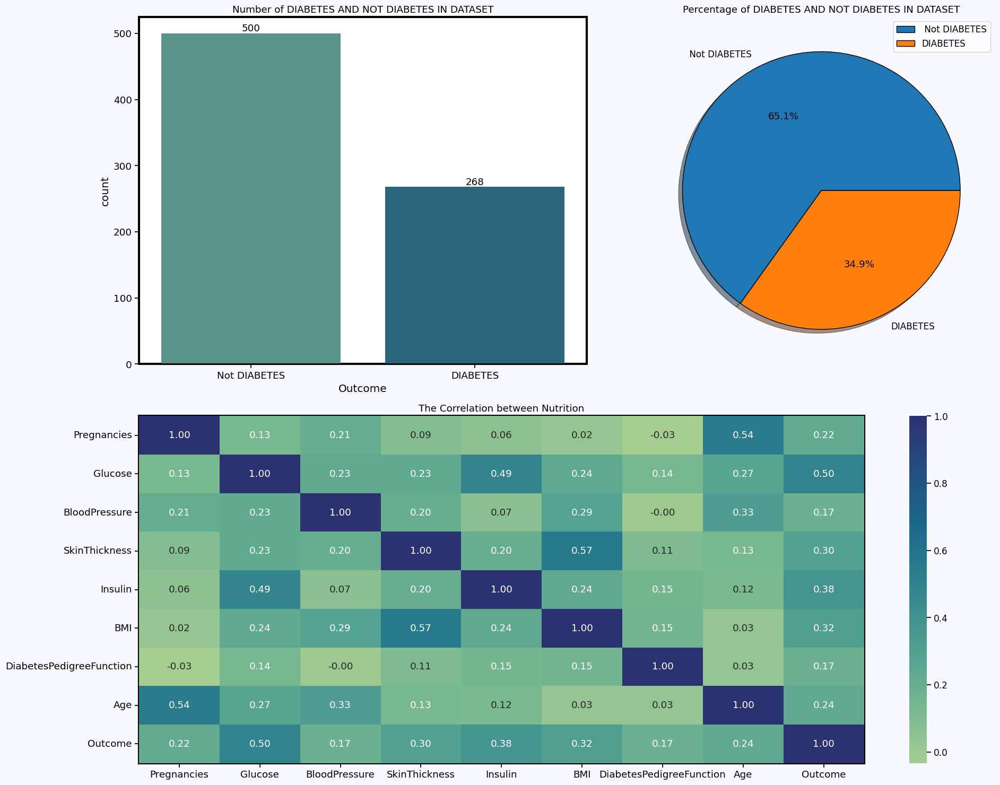

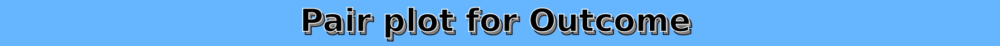

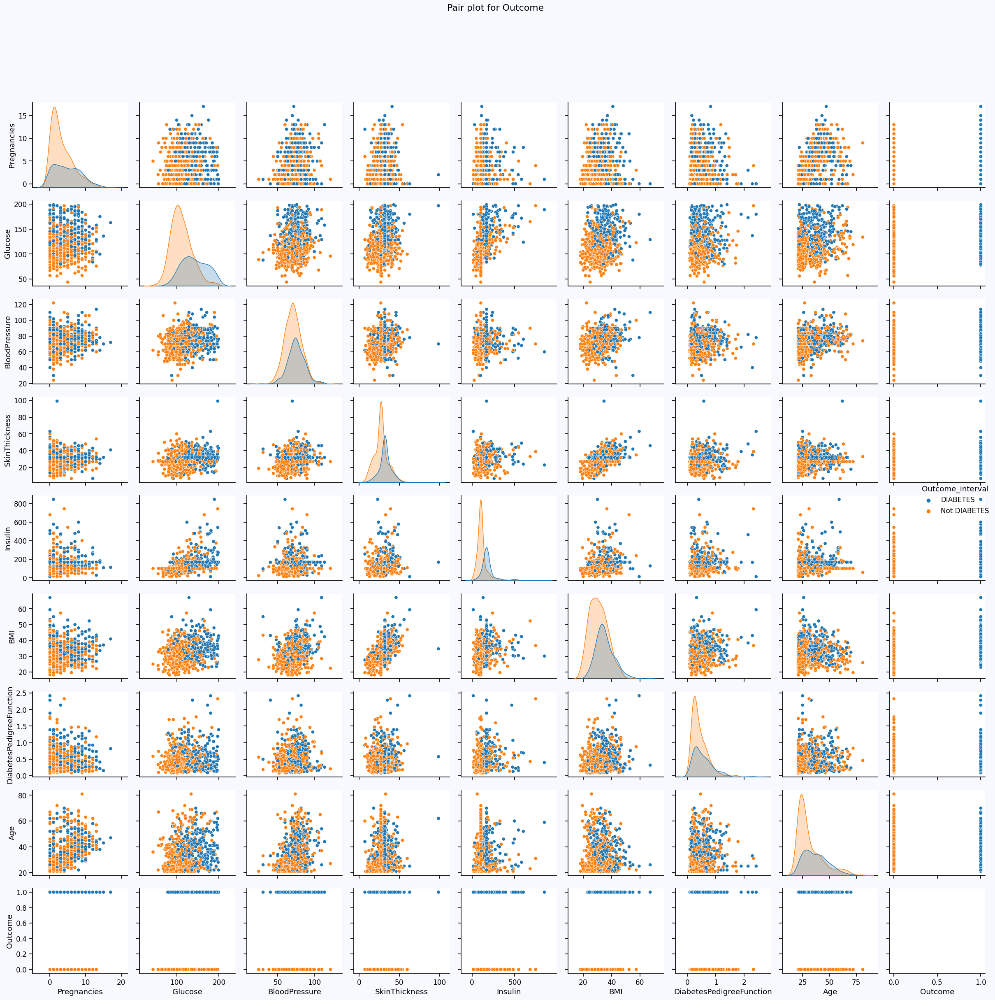

...

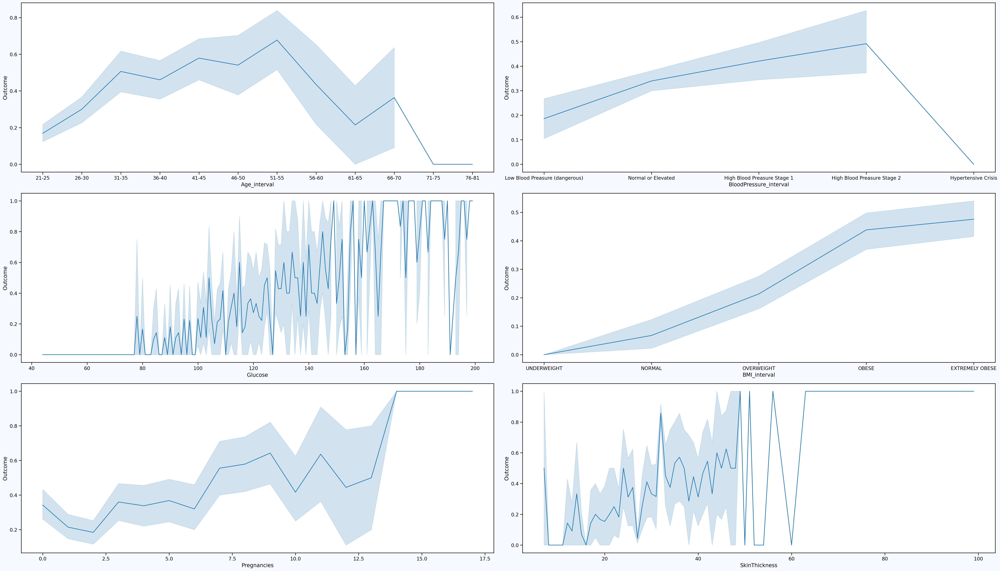

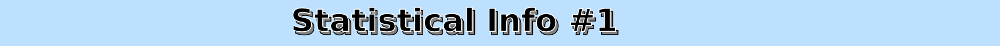

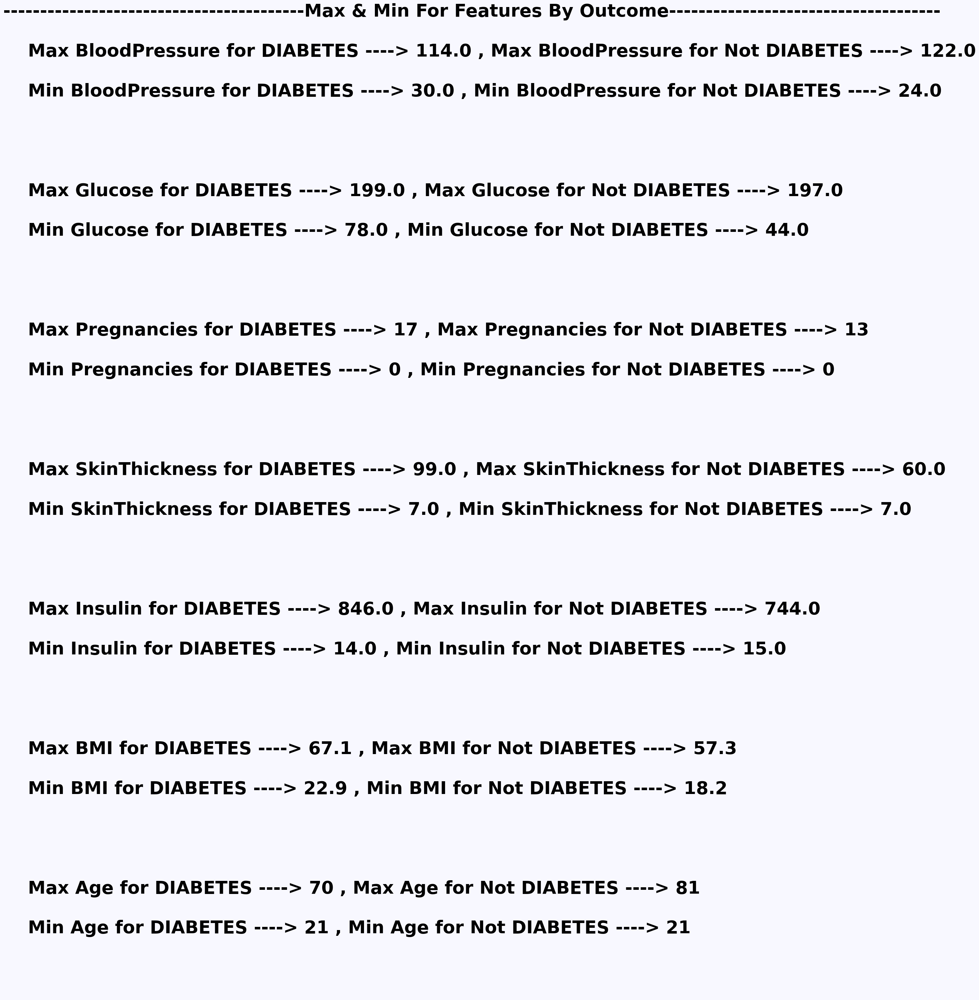

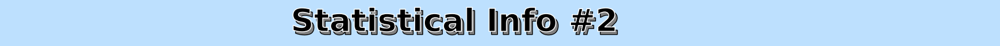

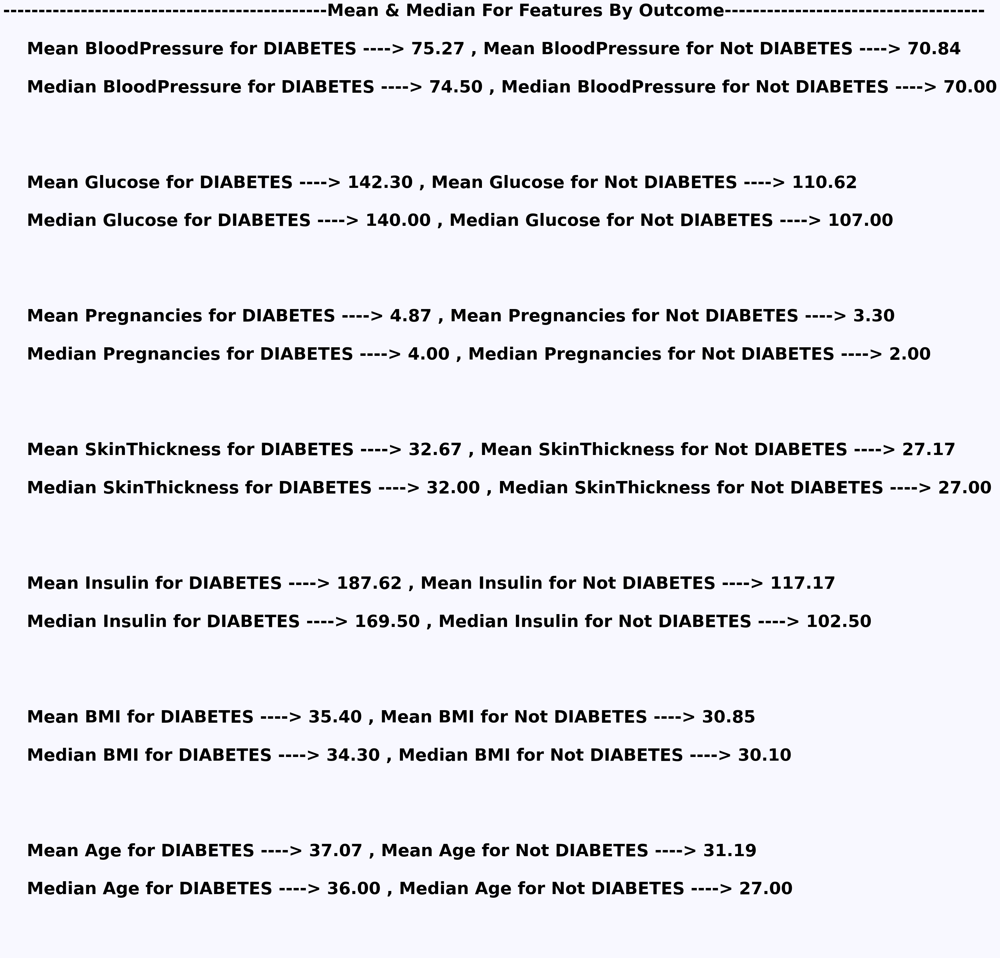

<Figure size 640x480 with 0 Axes>

In [32]:
General_Analysis()

<a id = "7" ></a>
# <span style="font-family:serif; font-size:28px;"> 5.  Specific Analysis </span>
<a id = "7" ></a>

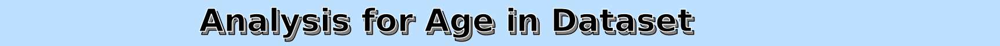

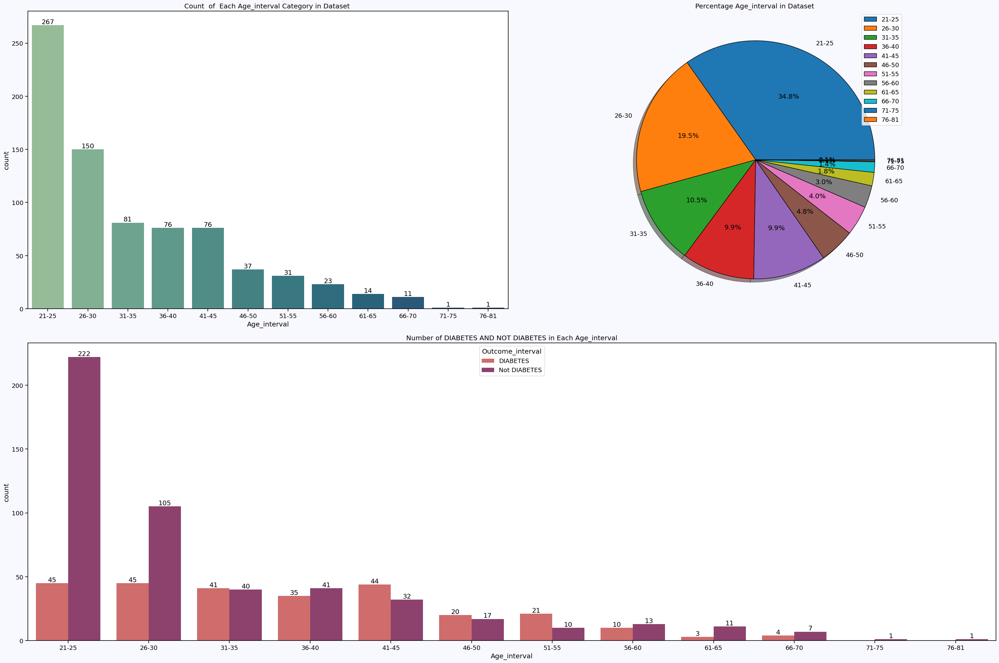

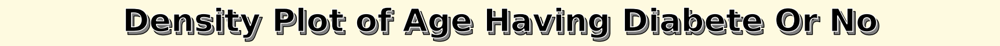

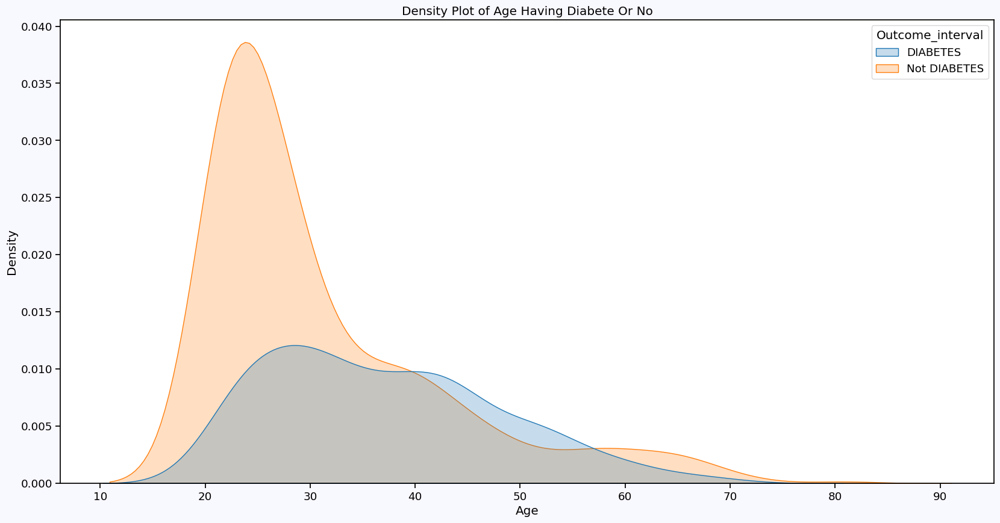

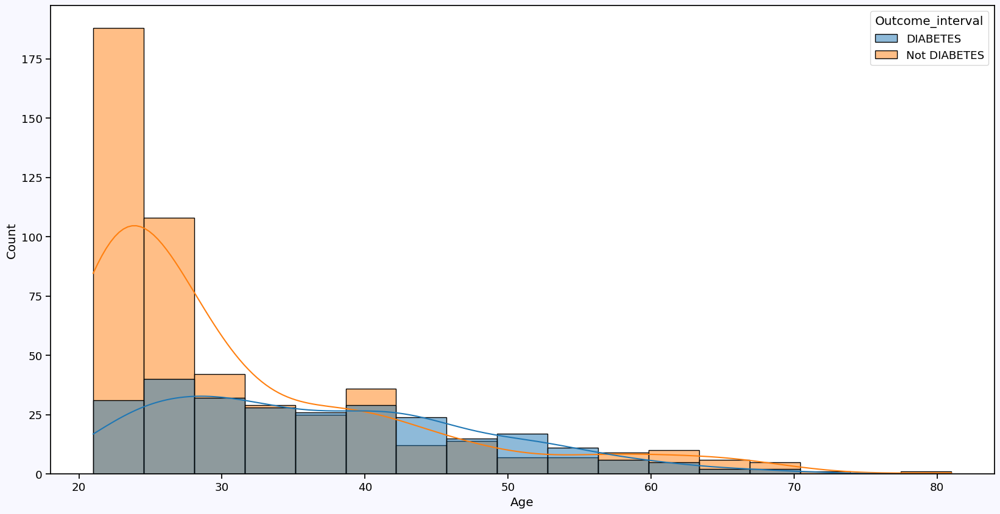

...

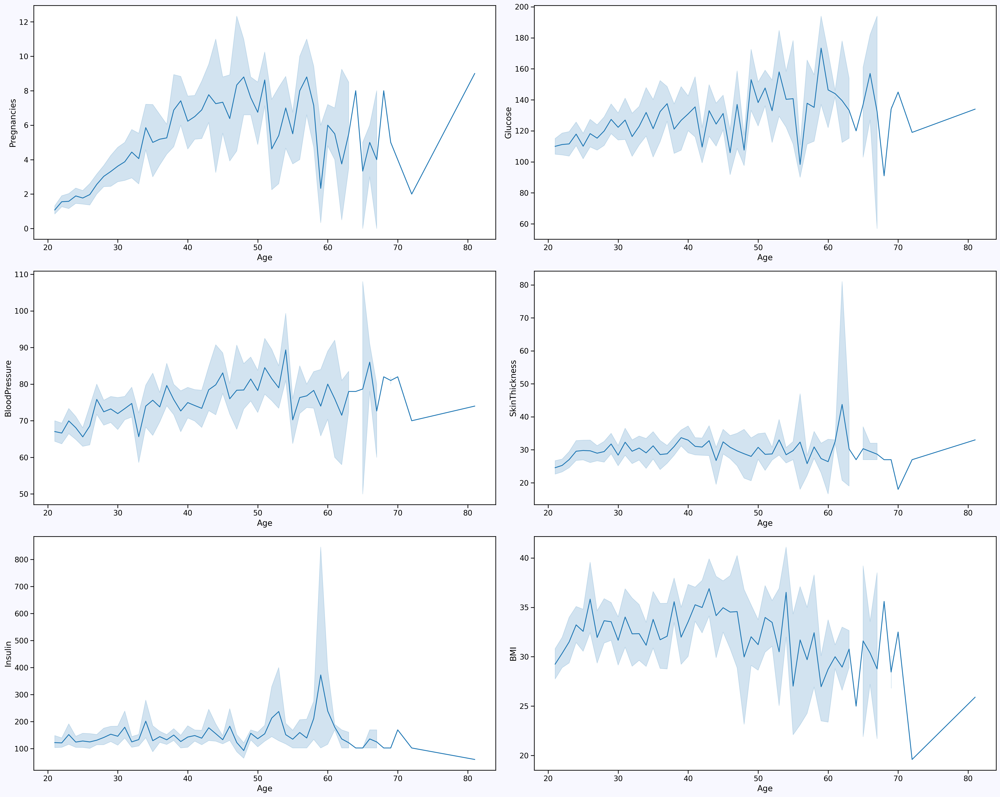

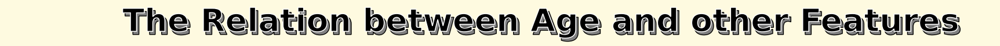

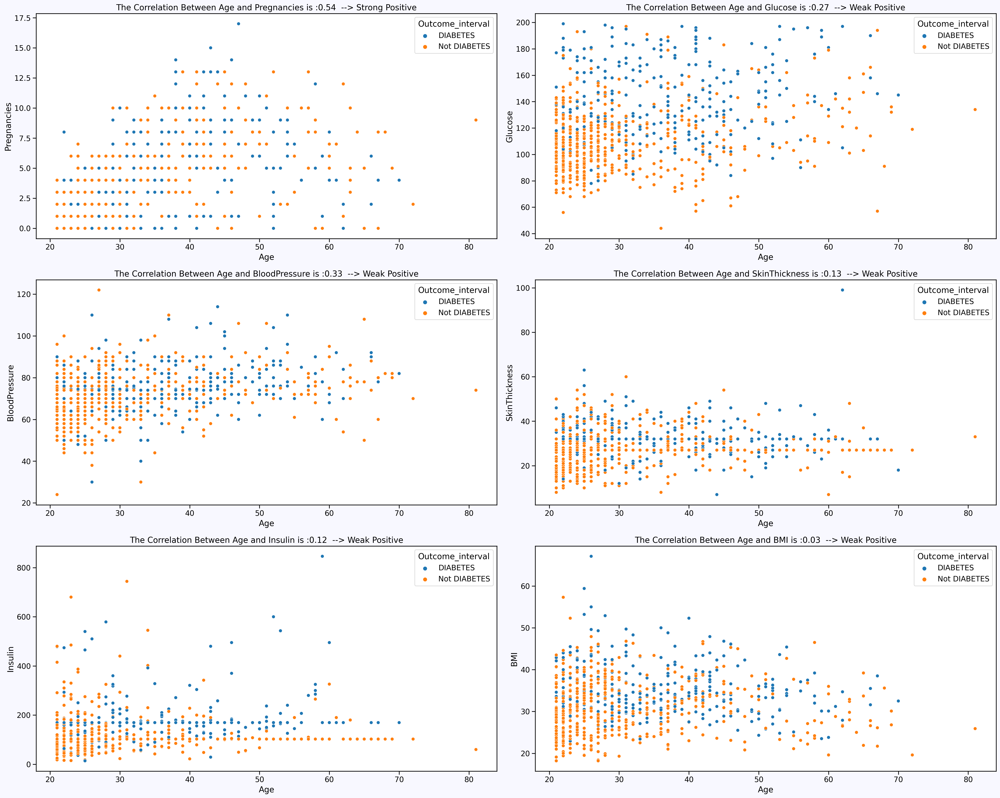

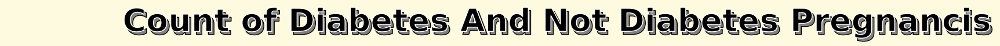

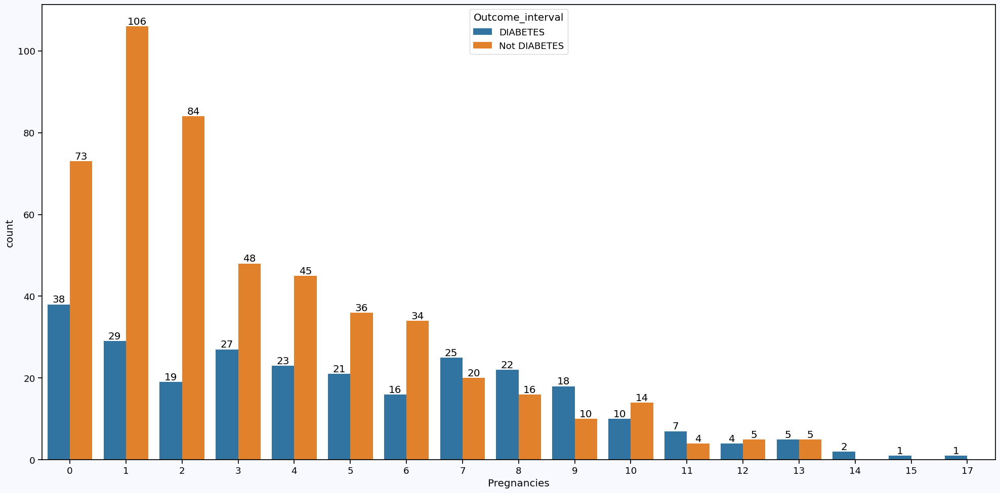

In [33]:
#'Age','BloodPressure', 'Glucose', 'BMI'
Specific_Analysis('Age')

<a id = "8" ></a>
# <span style="font-family:serif; font-size:30px;"> 6. Remove Outlier </span>
<a id = "8" ></a>

In [34]:
import pandas as pd
import numpy as np
from scipy import stats
new_df_out_2 = df[(np.abs(stats.zscore(df)) < 3).all(axis=1)]
new_df_out_2

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148.0,72.0,35.0,169.5,33.6,0.627,50,1
1,1,85.0,66.0,29.0,102.5,26.6,0.351,31,0
2,8,183.0,64.0,32.0,169.5,23.3,0.672,32,1
3,1,89.0,66.0,23.0,94.0,28.1,0.167,21,0
5,5,116.0,74.0,27.0,102.5,25.6,0.201,30,0
...,...,...,...,...,...,...,...,...,...
763,10,101.0,76.0,48.0,180.0,32.9,0.171,63,0
764,2,122.0,70.0,27.0,102.5,36.8,0.340,27,0
765,5,121.0,72.0,23.0,112.0,26.2,0.245,30,0
766,1,126.0,60.0,32.0,169.5,30.1,0.349,47,1
